In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import tensorflow as tf
import warnings

from matplotlib import pyplot as plt
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay, roc_auc_score, RocCurveDisplay
from sklearn.compose import ColumnTransformer
from sklearn.tree import export_graphviz
from keras.callbacks import EarlyStopping
from IPython.core.display import Image, display

warnings.filterwarnings("ignore")

C:\Users\rober\AppData\Local\Temp\ipykernel_47044\3579369774.py:17: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import Image, display


## Input

In [2]:
df = pd.read_csv('./spotify_data.csv', index_col=0)

display(df)

,artist_name,track_name,track_id,popularity,year,genre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,Jason Mraz,I Won't Give Up,53QF56cjZA9RTuuMZDrSA6,68,2012,acoustic,0.483,0.303,4,-10.058,1,0.0429,0.6940,0.000000,0.1150,0.1390,133.406,240166,3
1,Jason Mraz,93 Million Miles,1s8tP3jP4GZcyHDsjvw218,50,2012,acoustic,0.572,0.454,3,-10.286,1,0.0258,0.4770,0.000014,0.0974,0.5150,140.182,216387,4
2,Joshua Hyslop,Do Not Let Me Go,7BRCa8MPiyuvr2VU3O9W0F,57,2012,acoustic,0.409,0.234,3,-13.711,1,0.0323,0.3380,0.000050,0.0895,0.1450,139.832,158960,4
3,Boyce Avenue,Fast Car,63wsZUhUZLlh1OsyrZq7sz,58,2012,acoustic,0.392,0.251,10,-9.845,1,0.0363,0.8070,0.000000,0.0797,0.5080,204.961,304293,4
4,Andrew Belle,Sky's Still Blue,6nXIYClvJAfi6ujLiKqEq8,54,2012,acoustic,0.430,0.791,6,-5.419,0,0.0302,0.0726,0.019300,0.1100,0.2170,171.864,244320,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1473391,Nicola Conte,Black Spirits,0m27F0IGHLGAWhqd6ccYst,4,2011,trip-hop,0.373,0.742,10,-6.453,0,0.0736,0.3250,0.000141,0.1590,0.5220,107.951,344013,3
1473392,Nicola Conte,Quiet Dawn,6er9p611eHEcUCU50j7D57,3,2011,trip-hop,0.516,0.675,7,-7.588,0,0.0326,0.7880,0.000129,0.1300,0.2640,119.897,285067,4
1473393,Amon Tobin,Morning Ms Candis,7jsMMqxy1tt0rH5FzYcZTQ,2,2011,trip-hop,0.491,0.440,5,-8.512,1,0.0274,0.4770,0.003130,0.0936,0.0351,100.076,214253,4
1473394,Peace Orchestra,Happy Christmas (War Is Over),77lA1InUaXztuRk2vOzD1S,0,2011,trip-hop,0.480,0.405,0,-13.343,1,0.0276,0.4310,0.000063,0.1250,0.2020,133.885,239133,3


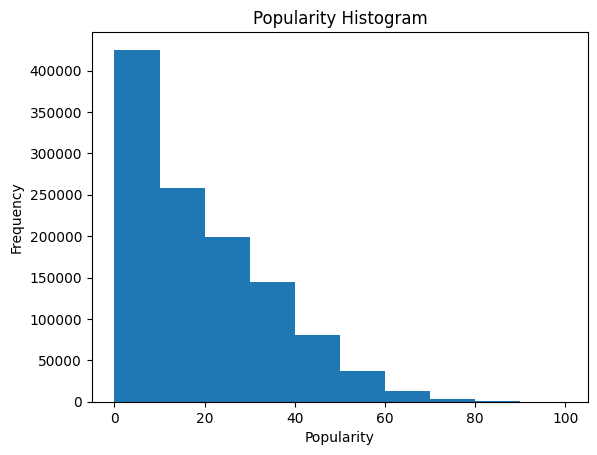

In [3]:
plt.hist(df['popularity'])
plt.title('Popularity Histogram')
plt.xlabel('Popularity')
plt.ylabel('Frequency')
plt.show()
#skewed predictor, will need balancing or use of the median to separate into binary categorization

In [4]:
df.describe()

,popularity,year,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
count,1.159764e+06,1.159764e+06,1.159764e+06,1.159764e+06,1.159764e+06,1.159764e+06,1.159764e+06,1.159764e+06,1.159764e+06,1.159764e+06,1.159764e+06,1.159764e+06,1.159764e+06,1.159764e+06,1.159764e+06
mean,1.838312e+01,2.011955e+03,5.374382e-01,6.396699e-01,5.287778e+00,-8.981353e+00,6.346533e-01,9.281477e-02,3.215370e-01,2.523489e-01,2.230189e-01,4.555636e-01,1.213771e+02,2.495618e+05,3.885879e+00
std,1.588554e+01,6.803901e+00,1.844780e-01,2.705009e-01,3.555197e+00,5.682215e+00,4.815275e-01,1.268409e-01,3.549872e-01,3.650731e-01,2.010707e-01,2.685190e-01,2.977975e+01,1.494262e+05,4.676967e-01
min,0.000000e+00,2.000000e+03,0.000000e+00,0.000000e+00,0.000000e+00,-5.810000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.073000e+03,0.000000e+00
25%,5.000000e+00,2.006000e+03,4.130000e-01,4.540000e-01,2.000000e+00,-1.082900e+01,0.000000e+00,3.710000e-02,6.400000e-03,1.050000e-06,9.790000e-02,2.260000e-01,9.879700e+01,1.810910e+05,4.000000e+00
50%,1.500000e+01,2.012000e+03,5.500000e-01,6.940000e-01,5.000000e+00,-7.450000e+00,1.000000e+00,5.070000e-02,1.470000e-01,1.760000e-03,1.340000e-01,4.380000e-01,1.219310e+02,2.257440e+05,4.000000e+00
75%,2.900000e+01,2.018000e+03,6.770000e-01,8.730000e-01,8.000000e+00,-5.276000e+00,1.000000e+00,8.900000e-02,6.400000e-01,6.140000e-01,2.920000e-01,6.740000e-01,1.399030e+02,2.869135e+05,4.000000e+00
max,1.000000e+02,2.023000e+03,9.930000e-01,1.000000e+00,1.100000e+01,6.172000e+00,1.000000e+00,9.710000e-01,9.960000e-01,1.000000e+00,1.000000e+00,1.000000e+00,2.499930e+02,6.000495e+06,5.000000e+00


In [5]:
#removing categorical cols
df = df.drop(columns=['artist_name', 'track_name', 'track_id'])

#will be comparing classical and death-metal 
df_1 = df[df['genre'] == 'classical']
df_1 = df_1.drop(columns='genre')
df_2 = df[df['genre'] == 'death-metal']
df_2 = df_2.drop(columns='genre')

In [6]:
display(df_1.describe())
display(df_2.describe())

,popularity,year,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
count,18259.000000,18259.000000,18259.000000,18259.000000,18259.000000,18259.000000,18259.000000,18259.000000,18259.000000,18259.000000,18259.000000,18259.000000,18259.000000,1.825900e+04,18259.000000
mean,24.903281,2010.954762,0.335244,0.221796,5.085273,-20.572483,0.633058,0.051803,0.822681,0.618457,0.149033,0.250110,107.695177,2.613153e+05,3.689742
std,10.524599,6.886370,0.141647,0.275848,3.406516,8.487990,0.481984,0.038835,0.319340,0.379545,0.120823,0.218444,32.813120,1.890845e+05,0.719636
min,0.000000,2000.000000,0.000000,0.000256,0.000000,-56.098000,0.000000,0.000000,0.000001,0.000000,0.018400,0.000000,0.000000,2.103900e+04,0.000000
25%,18.000000,2005.000000,0.223000,0.038800,2.000000,-26.372000,0.000000,0.038200,0.879000,0.167000,0.090200,0.073100,80.563500,1.445270e+05,3.000000
50%,24.000000,2011.000000,0.335000,0.111000,5.000000,-21.325000,1.000000,0.043300,0.968000,0.850000,0.109000,0.180000,102.193000,2.173330e+05,4.000000
75%,31.000000,2017.000000,0.440000,0.264000,8.000000,-15.659500,1.000000,0.051300,0.990000,0.913000,0.149000,0.365000,130.826000,3.155845e+05,4.000000
max,70.000000,2023.000000,0.857000,0.998000,11.000000,-1.501000,1.000000,0.923000,0.996000,0.997000,0.996000,0.991000,219.335000,2.619000e+06,5.000000


,popularity,year,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
count,18038.000000,18038.000000,18038.000000,18038.000000,18038.000000,18038.00000,18038.000000,18038.000000,18038.000000,18038.000000,18038.000000,18038.000000,18038.000000,1.803800e+04,18038.000000
mean,19.258177,2011.517352,0.353043,0.933075,5.375984,-5.29469,0.609657,0.120673,0.005817,0.378564,0.256945,0.229293,124.383225,2.449477e+05,3.843331
std,10.108988,6.892445,0.117894,0.090774,3.623934,2.10469,0.487841,0.065745,0.037532,0.364752,0.184541,0.149060,28.506295,1.008156e+05,0.518615
min,0.000000,2000.000000,0.000000,0.098500,0.000000,-23.27700,0.000000,0.000000,0.000000,0.000000,0.012100,0.000000,0.000000,1.289300e+04,0.000000
25%,12.000000,2006.000000,0.259000,0.924000,2.000000,-6.26200,0.000000,0.072200,0.000013,0.008833,0.114000,0.113000,104.605750,1.908000e+05,4.000000
50%,18.000000,2011.000000,0.347000,0.963000,6.000000,-5.00000,1.000000,0.107000,0.000067,0.258000,0.215000,0.199000,119.985000,2.345470e+05,4.000000
75%,25.000000,2018.000000,0.451000,0.983000,8.000000,-3.93525,1.000000,0.155000,0.000512,0.780000,0.342000,0.318000,140.067750,2.847188e+05,4.000000
max,64.000000,2023.000000,0.683000,1.000000,11.000000,0.40900,1.000000,0.566000,0.988000,0.995000,0.993000,0.967000,226.130000,1.979512e+06,5.000000


## EDA

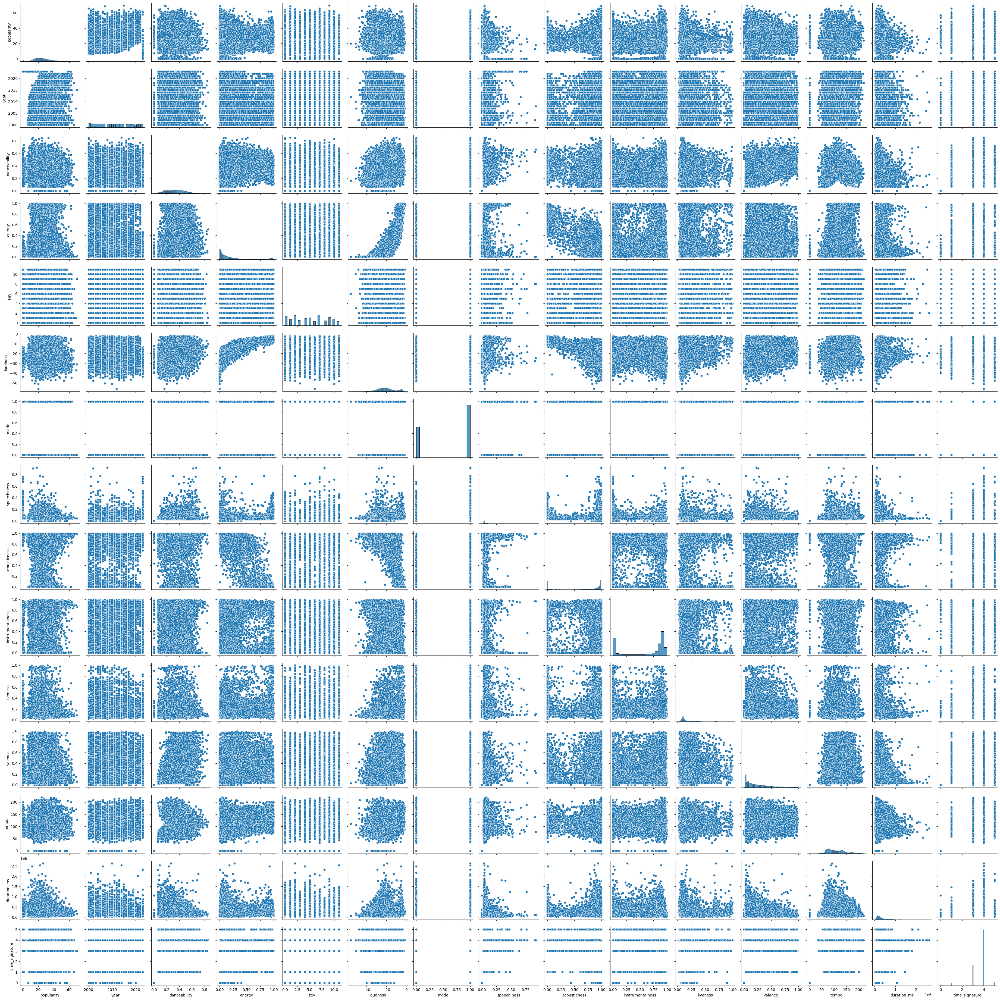

In [7]:
sns.pairplot(df_1)
plt.show()

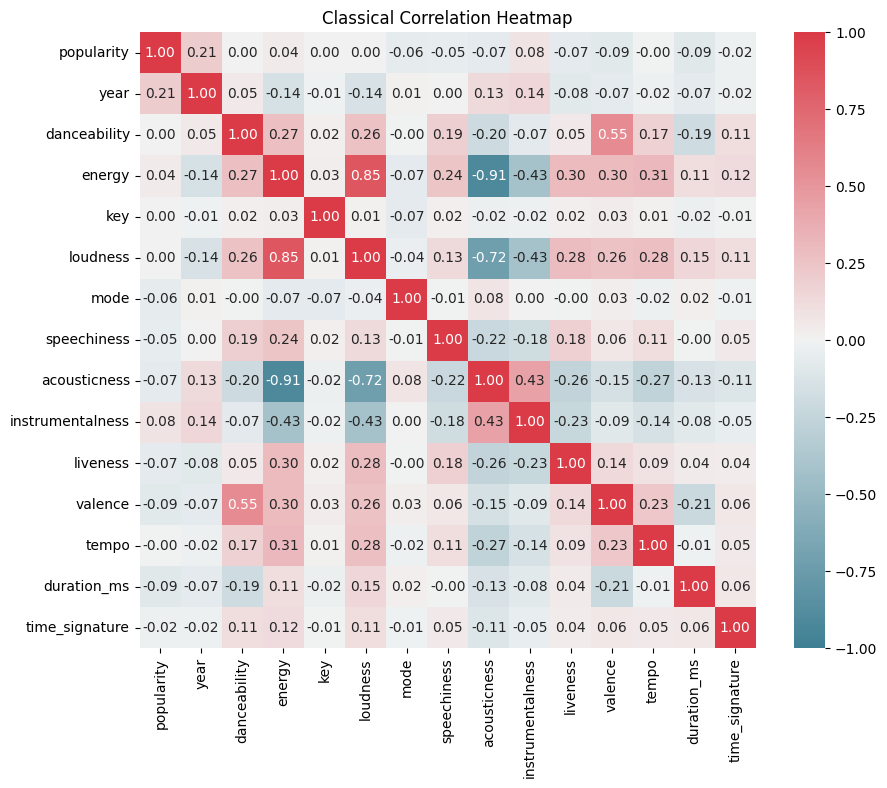

In [8]:
#correlation of classial
f, ax = plt.subplots(figsize=(10, 8))
corr = df_1.corr()
sns.heatmap(corr,
    cmap=sns.diverging_palette(220, 10, as_cmap=True),
    vmin=-1.0, vmax=1.0,
    square=True, ax=ax, annot=True, fmt='.2f')
plt.title("Classical Correlation Heatmap")
plt.show()

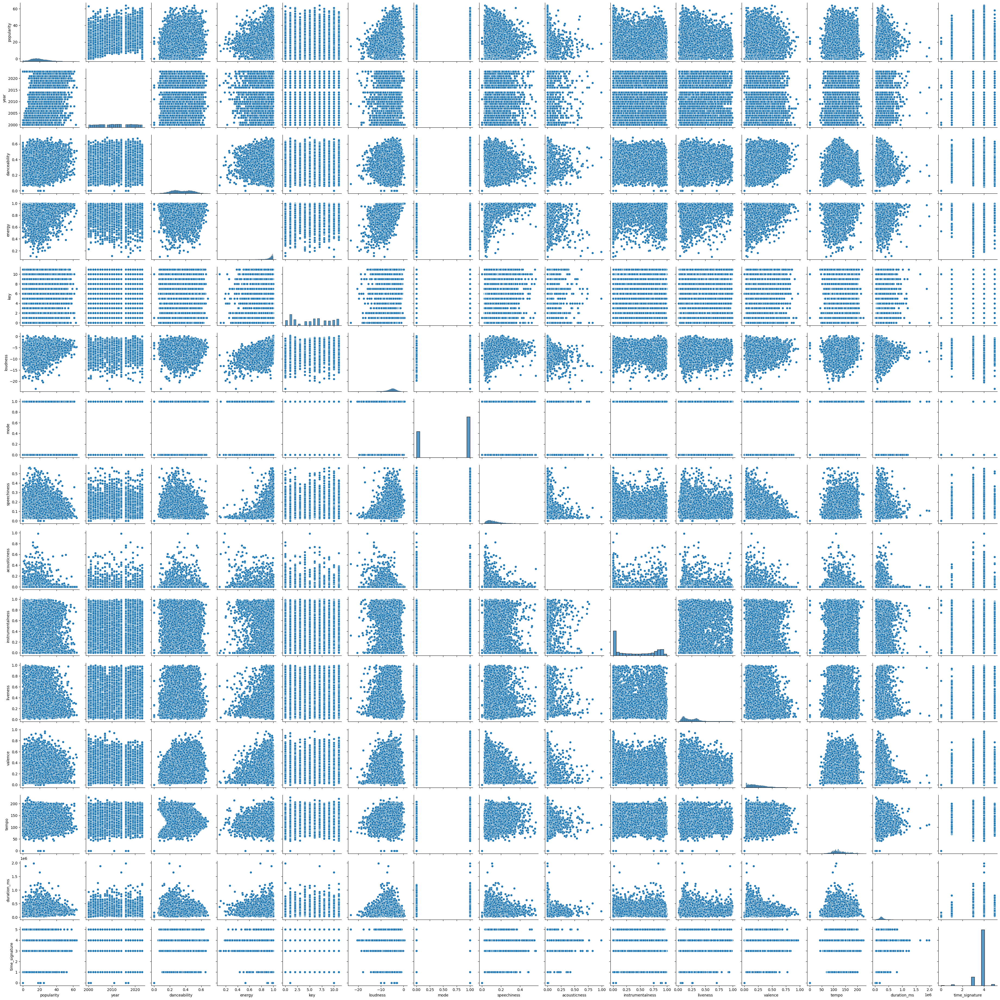

In [9]:
sns.pairplot(df_2)
plt.show()

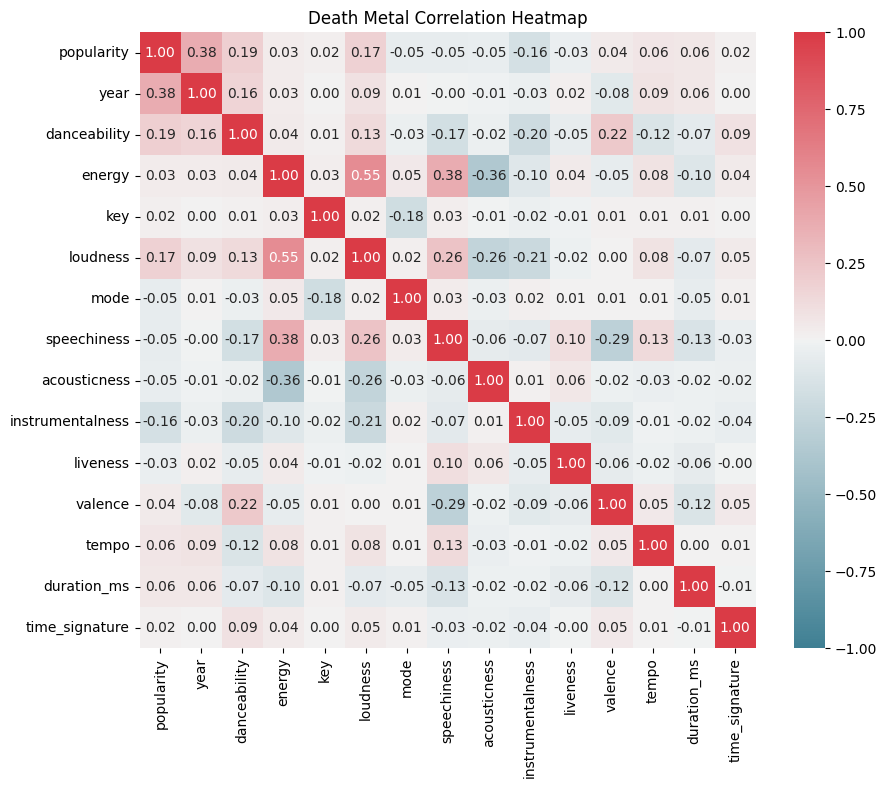

In [10]:
#correlation of death metal
f, ax = plt.subplots(figsize=(10, 8))
corr = df_2.corr()
sns.heatmap(corr,
    cmap=sns.diverging_palette(220, 10, as_cmap=True),
    vmin=-1.0, vmax=1.0,
    square=True, ax=ax, annot=True, fmt='.2f')
plt.title("Death Metal Correlation Heatmap")
plt.show()

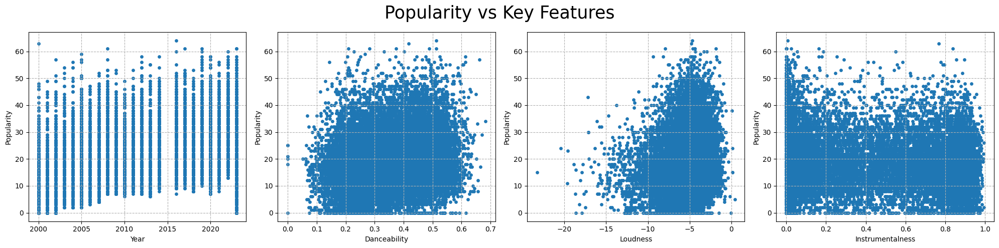

In [11]:
fig, ax = plt.subplots(1,4, figsize=[20,5], layout='tight')
fig.suptitle('Popularity vs Key Features', fontsize=25)

ax[0].set_ylabel('Popularity')
ax[0].set_xlabel('Year')
ax[0].scatter(df_2['year'], df_2['popularity'], s=15)
ax[0].grid(True, linestyle='--')

ax[1].set_ylabel('Popularity')
ax[1].set_xlabel('Danceability')
ax[1].scatter(df_2['danceability'], df_2['popularity'], s=15)
ax[1].grid(True, linestyle='--')

ax[2].set_ylabel('Popularity')
ax[2].set_xlabel('Loudness')
ax[2].scatter(df_2['loudness'], df_2['popularity'], s=15)
ax[2].grid(True, linestyle='--')

ax[3].set_ylabel('Popularity')
ax[3].set_xlabel('Instrumentalness')
ax[3].scatter(df_2['instrumentalness'], df_2['popularity'], s=15)
ax[3].grid(True, linestyle='--')

## Data Processing

In [12]:
#popularity threshold based on median popularity
df_1['popularity_bin'] = 0
df_1['popularity_bin'][df_1['popularity'] >= df_1['popularity'].median()] = 1

df_2['popularity_bin'] = 0
df_2['popularity_bin'][df_2['popularity'] >= df_2['popularity'].median()] = 1
#note that classical music and death-metal music have different median popularities (classical tends to be more popular)

#one-hot encoding
transformer = ColumnTransformer(
    transformers=[('onehot', OneHotEncoder(), ['key', 'time_signature', 'year'])],
    remainder='passthrough'
)
transformed_data = transformer.fit_transform(df_1).toarray()
df_1 = pd.DataFrame(transformed_data, columns=transformer.get_feature_names_out())
df_1.columns = df_1.columns.str.replace('remainder__', '')

transformer = ColumnTransformer(
    transformers=[('onehot', OneHotEncoder(), ['key', 'time_signature', 'year'])],
    remainder='passthrough'
)
transformed_data = transformer.fit_transform(df_2) #no idea why this one is automatically an array and the df_1 transform is not
df_2 = pd.DataFrame(transformed_data, columns=transformer.get_feature_names_out())
df_2.columns = df_2.columns.str.replace('remainder__', '')

#separate response variable
X_class = df_1.drop(columns=['popularity_bin', 'popularity'])
y_class = df_1[['popularity_bin']]

X_death = df_2.drop(columns=['popularity_bin', 'popularity'])
y_death = df_2[['popularity_bin']]

#60 20 20 split
X_class_train, X_class_test, y_class_train, y_class_test = train_test_split(X_class, y_class, test_size=0.2, random_state=1234, shuffle=True)
X_class_train, X_class_val, y_class_train, y_class_val = train_test_split(X_class_train, y_class_train, test_size=0.25, random_state=1234, shuffle=True)

#scale numeric features
SS = MinMaxScaler()
X_class_train[['danceability', 'energy','loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']] = SS.fit_transform(X_class_train[['danceability', 'energy','loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']])
X_class_val[['danceability', 'energy','loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']] = SS.transform(X_class_val[['danceability', 'energy','loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']])
X_class_test[['danceability', 'energy','loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']] = SS.transform(X_class_test[['danceability', 'energy','loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']])

#60 20 20 split
X_death_train, X_death_test, y_death_train, y_death_test = train_test_split(X_death, y_death, test_size=0.2, random_state=1234, shuffle=True)
X_death_train, X_death_val, y_death_train, y_death_val = train_test_split(X_death_train, y_death_train, test_size=0.25, random_state=1234, shuffle=True)

#scale numeric features
SS = MinMaxScaler()
X_death_train[['danceability', 'energy','loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']] = SS.fit_transform(X_death_train[['danceability', 'energy','loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']])
X_death_val[['danceability', 'energy','loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']] = SS.transform(X_death_val[['danceability', 'energy','loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']])
X_death_test[['danceability', 'energy','loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']] = SS.transform(X_death_test[['danceability', 'energy','loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']])

In [13]:
#check for majority class and also preview the baseline accuracy
display(y_class_train.value_counts(normalize=True))
display(y_death_train.value_counts(normalize=True))

popularity_bin
1.0               0.509904
0.0               0.490096
Name: proportion, dtype: float64

popularity_bin
1.0               0.526705
0.0               0.473295
Name: proportion, dtype: float64

## Modeling

In [14]:
#majority class baseline
class_base_train = y_class_train.copy()
class_base_train[class_base_train == class_base_train] = 1
class_base_val = y_class_val.copy()
class_base_val[class_base_val == class_base_val] = 1
class_base_test = y_class_test.copy()
class_base_test[class_base_test == class_base_test] = 1

death_base_train = y_death_train.copy()
death_base_train[death_base_train == death_base_train] = 1
death_base_val = y_death_val.copy()
death_base_val[death_base_val == death_base_val] = 1
death_base_test = y_death_test.copy()
death_base_test[death_base_test == death_base_test] = 1

print('Classical Baseline Val Accuracy:')
print(accuracy_score(y_class_val, class_base_val))
print('Classical Baseline Val Precision:')
print(precision_score(y_class_val, class_base_val))
print('Classical Baseline Val AUC Score:')
print(roc_auc_score(y_class_val, class_base_val))
print()
print('Death Metal Baseline Val Accuracy:')
print(accuracy_score(y_death_val, death_base_val))
print('Death Metal Baseline Val Precision:')
print(precision_score(y_death_val, death_base_val))
print('Death Metal Baseline Val AUC Score:')
print(roc_auc_score(y_death_val, death_base_val))

Classical Baseline Val Accuracy:
0.5134173055859803
Classical Baseline Val Precision:
0.5134173055859803
Classical Baseline Val AUC Score:
0.5

Death Metal Baseline Val Accuracy:
0.5169068736141907
Death Metal Baseline Val Precision:
0.5169068736141907
Death Metal Baseline Val AUC Score:
0.5


In [15]:
#Logistic Regression
class_LR = LogisticRegression(random_state=0)
class_LR.fit(X_class_train, y_class_train)

class_LR_train_pred = class_LR.predict(X_class_train)
class_LR_val_pred = class_LR.predict(X_class_val)
class_LR_test_pred = class_LR.predict(X_class_test)

class_LR_train_pred_raw = class_LR.predict_proba(X_class_train)[:, 1]
class_LR_val_pred_raw = class_LR.predict_proba(X_class_val)[:, 1]
class_LR_test_pred_raw = class_LR.predict_proba(X_class_test)[:, 1]

death_LR = LogisticRegression(random_state=0)
death_LR.fit(X_death_train, y_death_train)

death_LR_train_pred = death_LR.predict(X_death_train)
death_LR_val_pred = death_LR.predict(X_death_val)
death_LR_test_pred = death_LR.predict(X_death_test)

death_LR_train_pred_raw = death_LR.predict_proba(X_death_train)[:, 1]
death_LR_val_pred_raw = death_LR.predict_proba(X_death_val)[:, 1]
death_LR_test_pred_raw = death_LR.predict_proba(X_death_test)[:, 1]


print('Classical Logistic Regression Val Accuracy:')
print(accuracy_score(y_class_val, class_LR_val_pred))
print('Classical Logistic Regression Val Precision:')
print(precision_score(y_class_val, class_LR_val_pred))
print('Classical Logistic Regression Val AUC Score:')
print(roc_auc_score(y_class_val, class_LR_val_pred_raw))
print()
print('Death Metal Logistic Regression Val Accuracy:')
print(accuracy_score(y_death_val, death_LR_val_pred))
print('Death Metal Logistic Regression Val Precision:')
print(precision_score(y_death_val, death_LR_val_pred))
print('Death Metal Logistic Regression Val AUC Score:')
print(roc_auc_score(y_death_val, death_LR_val_pred_raw))

Classical Logistic Regression Val Accuracy:
0.6900328587075575
Classical Logistic Regression Val Precision:
0.7588850174216027
Classical Logistic Regression Val AUC Score:
0.76457310073157

Death Metal Logistic Regression Val Accuracy:
0.6746119733924612
Death Metal Logistic Regression Val Precision:
0.674406865219586
Death Metal Logistic Regression Val AUC Score:
0.7350342003786882


In [16]:
#Random Forest Classifier
class_RFC = RandomForestClassifier(random_state=0)
class_RFC.fit(X_class_train, y_class_train)

class_RFC_train_pred = class_RFC.predict(X_class_train)
class_RFC_val_pred = class_RFC.predict(X_class_val)
class_RFC_test_pred = class_RFC.predict(X_class_test)

class_RFC_train_pred_raw = class_RFC.predict_proba(X_class_train)[:, 1]
class_RFC_val_pred_raw = class_RFC.predict_proba(X_class_val)[:, 1]
class_RFC_test_pred_raw = class_RFC.predict_proba(X_class_test)[:, 1]

death_RFC = RandomForestClassifier(random_state=0)
death_RFC.fit(X_death_train, y_death_train)

death_RFC_train_pred = death_RFC.predict(X_death_train)
death_RFC_val_pred = death_RFC.predict(X_death_val)
death_RFC_test_pred = death_RFC.predict(X_death_test)

death_RFC_train_pred_raw = death_RFC.predict_proba(X_death_train)[:, 1]
death_RFC_val_pred_raw = death_RFC.predict_proba(X_death_val)[:, 1]
death_RFC_test_pred_raw = death_RFC.predict_proba(X_death_test)[:, 1]

print('Classical Random Forest Val Accuracy:')
print(accuracy_score(y_class_val, class_RFC_val_pred))
print('Classical Random Forest Val Precision:')
print(precision_score(y_class_val, class_RFC_val_pred))
print('Classical Random Forest Val AUC Score:')
print(roc_auc_score(y_class_val, class_RFC_val_pred_raw))
print()
print('Death Metal Random Forest Val Accuracy:')
print(accuracy_score(y_death_val, death_RFC_val_pred))
print('Death Metal Random Forest Val Precision:')
print(precision_score(y_death_val, death_RFC_val_pred))
print('Death Metal Random Forest Val AUC Score:')
print(roc_auc_score(y_death_val, death_RFC_val_pred_raw))

Classical Random Forest Val Accuracy:
0.6974260679079957
Classical Random Forest Val Precision:
0.7503250975292588
Classical Random Forest Val AUC Score:
0.7690329018945788

Death Metal Random Forest Val Accuracy:
0.6887472283813747
Death Metal Random Forest Val Precision:
0.6862449799196787
Death Metal Random Forest Val AUC Score:
0.762991760223583


In [17]:
#Neural Net 
def build_model(n_features, hidden_layer_sizes=[], learning_rate=0.0001):
    tf.keras.backend.clear_session()
    np.random.seed(0)
    tf.random.set_seed(0)
    
    model = tf.keras.Sequential()
    model.add(tf.keras.Input(shape=(n_features,), name='Input'))
    for hidden_layer_size in hidden_layer_sizes:
        model.add(tf.keras.layers.Dense(units=hidden_layer_size, activation='relu'))
        model.add(tf.keras.layers.Dropout(rate=0.2))
    model.add(tf.keras.layers.Dense(units=1, activation='sigmoid', name='Output'))
    model.compile(loss='binary_crossentropy',
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
        metrics=['accuracy']
        )
    return model


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4990 - loss: 0.6960 - val_accuracy: 0.5748 - val_loss: 0.6882
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5414 - loss: 0.6890 - val_accuracy: 0.6221 - val_loss: 0.6805
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5702 - loss: 0.6825 - val_accuracy: 0.6509 - val_loss: 0.6679
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6025 - loss: 0.6714 - val_accuracy: 0.6659 - val_loss: 0.6480
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6197 - loss: 0.6565 - val_accuracy: 0.6755 - val_loss: 0.6231
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6405 - loss: 0.6378 - val_accuracy: 0.6815 - val_loss: 0.5990
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6469 - loss: 0.6230 - val_accuracy: 0.6835 - val_loss: 0.5834
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6559 - loss: 0.6096 - val_accuracy: 0

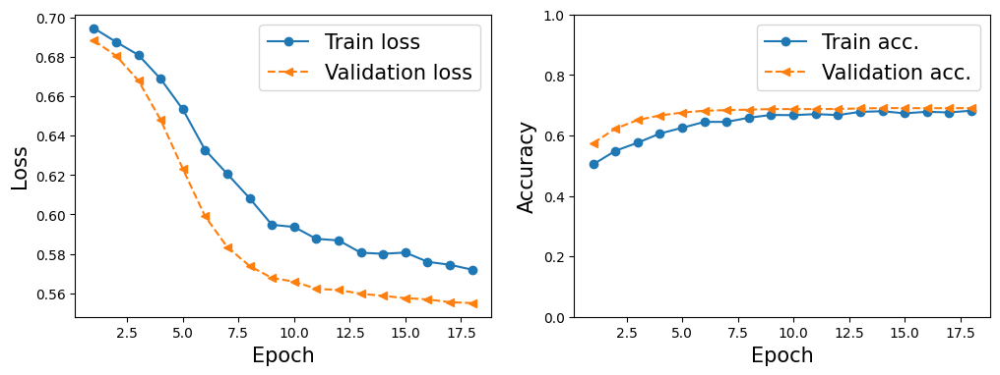

In [18]:
n_features = X_class_train.shape[1]

class_nn = build_model(n_features=n_features, hidden_layer_sizes=[n_features*4, n_features*4, n_features*2, n_features*2], learning_rate=0.00005)

es = EarlyStopping(monitor='val_accuracy', 
    mode='max', 
    patience=4, #epochs of no improvement
    restore_best_weights=True)

history = class_nn.fit(
    x=X_class_train,
    y=y_class_train,
    callbacks=[es],
    epochs=50,
    batch_size=100,
    validation_data=(X_class_val, y_class_val),
    verbose=1)

class_NN_train_pred_raw = class_nn.predict(X_class_train)
class_NN_train_pred = [1 if prob > 0.5 else 0 for prob in np.ravel(class_NN_train_pred_raw)]
class_NN_val_pred_raw = class_nn.predict(X_class_val)
class_NN_val_pred = [1 if prob > 0.5 else 0 for prob in np.ravel(class_NN_val_pred_raw)]
class_NN_test_pred_raw = class_nn.predict(X_class_test)
class_NN_test_pred = [1 if prob > 0.5 else 0 for prob in np.ravel(class_NN_test_pred_raw)]

hist = history.history
x_arr = np.arange(len(hist['loss'])) + 1

fig = plt.figure(figsize=(12, 4))
ax = fig.add_subplot(1, 2, 1)
ax.plot(x_arr, hist['loss'], '-o', label='Train loss')
ax.plot(x_arr, hist['val_loss'], '--<', label='Validation loss')
ax.legend(fontsize=15)
ax.set_xlabel('Epoch', size=15)
ax.set_ylabel('Loss', size=15)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x_arr, hist['accuracy'], '-o', label='Train acc.')
ax.plot(x_arr, hist['val_accuracy'], '--<', label='Validation acc.')
ax.legend(fontsize=15)
ax.set_xlabel('Epoch', size=15)
ax.set_ylabel('Accuracy', size=15)
ax.set_ylim(0,1)
plt.show()

In [19]:
print('Classical NN Val Accuracy:')
print(accuracy_score(y_class_val, class_NN_val_pred))
print('Classical NN Val Precision:')
print(precision_score(y_class_val, class_NN_val_pred))
print('Classical NN Val AUC Score:')
print(roc_auc_score(y_class_val, class_NN_val_pred_raw))

Classical NN Val Accuracy:
0.6903066812705367
Classical NN Val Precision:
0.7985553772070626
Classical NN Val AUC Score:
0.7652414931532545


Epoch 1/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5092 - loss: 0.6948 - val_accuracy: 0.5538 - val_loss: 0.6856
Epoch 2/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5568 - loss: 0.6834 - val_accuracy: 0.6111 - val_loss: 0.6700
Epoch 3/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6047 - loss: 0.6681 - val_accuracy: 0.6544 - val_loss: 0.6368
Epoch 4/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6543 - loss: 0.6349 - val_accuracy: 0.6621 - val_loss: 0.6156
Epoch 5/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6626 - loss: 0.6184 - val_accuracy: 0.6649 - val_loss: 0.6102
Epoch 6/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6746 - loss: 0.6092 - val_accuracy: 0.6657 - val_loss: 0.6074
Epoch 7/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6678 - loss: 0.6072 - val_accuracy: 0.6693 - val_loss: 0.6064
Epoch 8/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6704 - loss: 0.6036 - val_accuracy: 0.

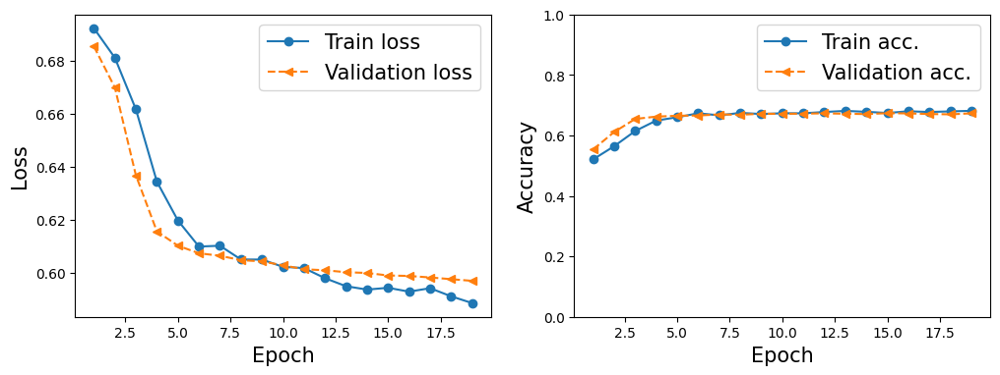

In [20]:
n_features = X_death_train.shape[1]

death_nn = build_model(n_features=n_features, hidden_layer_sizes=[n_features*4, n_features*4, n_features*2, n_features*2], learning_rate=0.0001)

es = EarlyStopping(monitor='val_accuracy', 
    mode='max', 
    patience=4, #epochs of no improvement
    restore_best_weights=True)

history = death_nn.fit(
    x=X_death_train,
    y=y_death_train,
    callbacks=[es],
    epochs=50,
    batch_size=100,
    validation_data=(X_death_val, y_death_val),
    verbose=1)

death_NN_train_pred_raw = death_nn.predict(X_death_train)
death_NN_train_pred = [1 if prob > 0.5 else 0 for prob in np.ravel(death_NN_train_pred_raw)]
death_NN_val_pred_raw = death_nn.predict(X_death_val)
death_NN_val_pred = [1 if prob > 0.5 else 0 for prob in np.ravel(death_NN_val_pred_raw)]
death_NN_test_pred_raw = death_nn.predict(X_death_test)
death_NN_test_pred = [1 if prob > 0.5 else 0 for prob in np.ravel(death_NN_test_pred_raw)]

hist = history.history
x_arr = np.arange(len(hist['loss'])) + 1

fig = plt.figure(figsize=(12, 4))
ax = fig.add_subplot(1, 2, 1)
ax.plot(x_arr, hist['loss'], '-o', label='Train loss')
ax.plot(x_arr, hist['val_loss'], '--<', label='Validation loss')
ax.legend(fontsize=15)
ax.set_xlabel('Epoch', size=15)
ax.set_ylabel('Loss', size=15)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x_arr, hist['accuracy'], '-o', label='Train acc.')
ax.plot(x_arr, hist['val_accuracy'], '--<', label='Validation acc.')
ax.legend(fontsize=15)
ax.set_xlabel('Epoch', size=15)
ax.set_ylabel('Accuracy', size=15)
ax.set_ylim(0,1)
plt.show()

In [21]:
print('Death Metal NN Val Accuracy:')
print(accuracy_score(y_death_val, death_NN_val_pred))
print('Death Metal NN Val Precision:')
print(precision_score(y_death_val, death_NN_val_pred))
print('Death Metal NN Val AUC Score:')
print(roc_auc_score(y_death_val, death_NN_val_pred_raw))

Death Metal NN Val Accuracy:
0.6735033259423503
Death Metal NN Val Precision:
0.6793733681462141
Death Metal NN Val AUC Score:
0.7365604893722727


## Best Model Selection

In [22]:
#create arrays for each error metric (accuracy, precision, and auc score)
class_train_accuracies = np.array([accuracy_score(y_class_train, class_base_train), accuracy_score(y_class_train, class_LR_train_pred), accuracy_score(y_class_train, class_RFC_train_pred), accuracy_score(y_class_train, class_NN_train_pred)])
class_train_precisions = np.array([precision_score(y_class_train, class_base_train), precision_score(y_class_train, class_LR_train_pred), precision_score(y_class_train, class_RFC_train_pred), precision_score(y_class_train, class_NN_train_pred)])
class_train_auc_scores = np.array([roc_auc_score(y_class_train, class_base_train), roc_auc_score(y_class_train, class_LR_train_pred_raw), roc_auc_score(y_class_train, class_RFC_train_pred_raw), roc_auc_score(y_class_train, class_NN_train_pred_raw)])

class_val_accuracies = np.array([accuracy_score(y_class_val, class_base_val), accuracy_score(y_class_val, class_LR_val_pred), accuracy_score(y_class_val, class_RFC_val_pred), accuracy_score(y_class_val, class_NN_val_pred)])
class_val_precisions = np.array([precision_score(y_class_val, class_base_val), precision_score(y_class_val, class_LR_val_pred), precision_score(y_class_val, class_RFC_val_pred), precision_score(y_class_val, class_NN_val_pred)])
class_val_auc_scores = np.array([roc_auc_score(y_class_val, class_base_val), roc_auc_score(y_class_val, class_LR_val_pred_raw), roc_auc_score(y_class_val, class_RFC_val_pred_raw), roc_auc_score(y_class_val, class_NN_val_pred_raw)])

class_test_accuracies = np.array([accuracy_score(y_class_test, class_base_test), accuracy_score(y_class_test, class_LR_test_pred), accuracy_score(y_class_test, class_RFC_test_pred), accuracy_score(y_class_test, class_NN_test_pred)])
class_test_precisions = np.array([precision_score(y_class_test, class_base_test), precision_score(y_class_test, class_LR_test_pred), precision_score(y_class_test, class_RFC_test_pred), precision_score(y_class_test, class_NN_test_pred)])
class_test_auc_scores = np.array([roc_auc_score(y_class_test, class_base_test), roc_auc_score(y_class_test, class_LR_test_pred_raw), roc_auc_score(y_class_test, class_RFC_test_pred_raw), roc_auc_score(y_class_test, class_NN_test_pred_raw)])

death_train_accuracies = np.array([accuracy_score(y_death_train, death_base_train), accuracy_score(y_death_train, death_LR_train_pred), accuracy_score(y_death_train, death_RFC_train_pred), accuracy_score(y_death_train, death_NN_train_pred)])
death_train_precisions = np.array([precision_score(y_death_train, death_base_train), precision_score(y_death_train, death_LR_train_pred), precision_score(y_death_train, death_RFC_train_pred), precision_score(y_death_train, death_NN_train_pred)])
death_train_auc_scores = np.array([roc_auc_score(y_death_train, death_base_train), roc_auc_score(y_death_train, death_LR_train_pred_raw), roc_auc_score(y_death_train, death_RFC_train_pred_raw), roc_auc_score(y_death_train, death_NN_train_pred_raw)])

death_val_accuracies = np.array([accuracy_score(y_death_val, death_base_val), accuracy_score(y_death_val, death_LR_val_pred), accuracy_score(y_death_val, death_RFC_val_pred), accuracy_score(y_death_val, death_NN_val_pred)])
death_val_precisions = np.array([precision_score(y_death_val, death_base_val), precision_score(y_death_val, death_LR_val_pred), precision_score(y_death_val, death_RFC_val_pred), precision_score(y_death_val, death_NN_val_pred)])
death_val_auc_scores = np.array([roc_auc_score(y_death_val, death_base_val), roc_auc_score(y_death_val, death_LR_val_pred_raw), roc_auc_score(y_death_val, death_RFC_val_pred_raw), roc_auc_score(y_death_val, death_NN_val_pred_raw)])

death_test_accuracies = np.array([accuracy_score(y_death_test, death_base_test), accuracy_score(y_death_test, death_LR_test_pred), accuracy_score(y_death_test, death_RFC_test_pred), accuracy_score(y_death_test, death_NN_test_pred)])
death_test_precisions = np.array([precision_score(y_death_test, death_base_test), precision_score(y_death_test, death_LR_test_pred), precision_score(y_death_test, death_RFC_test_pred), precision_score(y_death_test, death_NN_test_pred)])
death_test_auc_scores = np.array([roc_auc_score(y_death_test, death_base_test), roc_auc_score(y_death_test, death_LR_test_pred_raw), roc_auc_score(y_death_test, death_RFC_test_pred_raw), roc_auc_score(y_death_test, death_NN_test_pred_raw)])

In [23]:
#order: baseline, LR, RFC, NN
print(death_val_accuracies)
print(death_val_precisions)
print(death_val_auc_scores)

[0.51690687 0.67461197 0.68874723 0.67350333]
[0.51690687 0.67440687 0.68624498 0.67937337]
[0.5        0.7350342  0.76299176 0.73656049]


In [24]:
#min-max normalize each metric, take inverse for AUC Score due to inverse scaling, and sum the 3 results per model. Best model will have the largest sum
death_val_accuracies_norm = (death_val_accuracies - min(death_val_accuracies)) / (max(death_val_accuracies) - min(death_val_accuracies))
death_val_precisions_norm = (death_val_precisions - min(death_val_precisions)) / (max(death_val_precisions) - min(death_val_precisions))
death_val_auc_scores_norm = (death_val_auc_scores - min(death_val_auc_scores)) / (max(death_val_auc_scores) - min(death_val_auc_scores))

death_val_combined = death_val_accuracies_norm + death_val_precisions_norm + death_val_auc_scores_norm

In [25]:
print(death_val_combined) #RFC is the victor

[0.         2.74152794 3.         2.7702088 ]


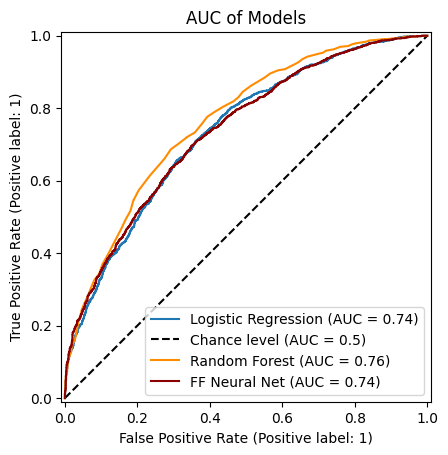

In [26]:
disp1 = RocCurveDisplay.from_predictions(
    y_death_val, death_LR_val_pred_raw,
    plot_chance_level=True,
    name='Logistic Regression'
)

disp2 = RocCurveDisplay.from_predictions(
    y_death_val, death_RFC_val_pred_raw,
    color='darkorange',
    name='Random Forest',
    ax=disp1.ax_
)

disp3 = RocCurveDisplay.from_predictions(
    y_death_val, death_NN_val_pred_raw,
    color='darkred',
    name='FF Neural Net',
    ax=disp1.ax_
)

plt.title('AUC of Models')
plt.show()

In [27]:
# Let's compare RFC feature importance to LR
coeff_df = pd.DataFrame({
    'Feature' : X_death_train.columns.values,
    'Feature Importance' : death_RFC.feature_importances_
})

display(coeff_df.sort_values(by='Feature Importance', ascending=False).reset_index(drop=True).head(10))

,Feature,Feature Importance
0,danceability,0.083296
1,loudness,0.081751
2,instrumentalness,0.076436
3,duration_ms,0.072134
4,tempo,0.069519
5,speechiness,0.069384
6,acousticness,0.068290
7,valence,0.068242
8,liveness,0.065552
9,energy,0.063458


In [28]:
coeff_df = pd.DataFrame({
    'Feature' : X_death_train.columns.values,
    'Coefficient' : np.abs(death_LR.coef_.flatten())
})

display(coeff_df.sort_values(by='Coefficient', ascending=False).head(10).style.hide())
#the feature importances of RFC are differently ordered compared to the coefficients of LR and also the importances are more evenly distributed across all features

Feature,Coefficient
loudness,3.021913
onehot__year_2022,2.427188
onehot__year_2001,1.743497
duration_ms,1.739616
onehot__year_2000,1.402424
energy,1.181798
onehot__year_2021,1.170768
speechiness,1.044374
onehot__year_2003,1.026138
onehot__year_2019,1.023857


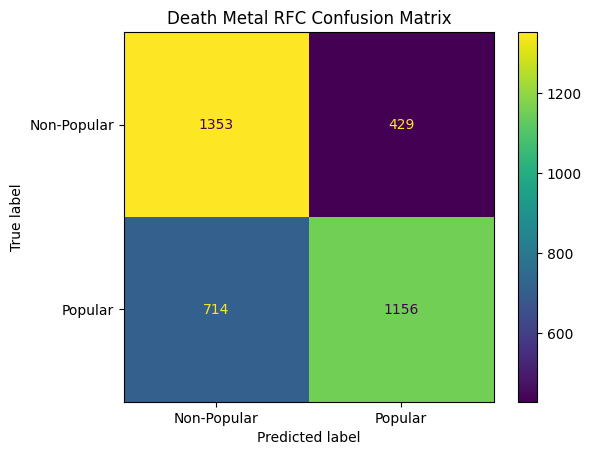

Death Metal RFC Test Accuracy:
0.7009423503325942
Death Metal RFC Test Precision:
0.7036852589641435
Death Metal RFC Test AUC Score:
0.7622558858969235


In [29]:
#now we can check how the best model performs on new data
cm = confusion_matrix(y_true = y_class_test, y_pred = class_RFC_test_pred, labels=[0,1])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Non-Popular', 'Popular'])
disp.plot()
plt.title("Death Metal RFC Confusion Matrix")
plt.show()
print('Death Metal RFC Test Accuracy:')
print(accuracy_score(y_death_test, death_RFC_test_pred))
print('Death Metal RFC Test Precision:')
print(precision_score(y_death_test, death_RFC_test_pred))
print('Death Metal RFC Test AUC Score:')
print(roc_auc_score(y_death_test, death_RFC_test_pred_raw))